## this version imports regression model and works with either the residual of the full model or just of the drift terms. See v2.0 for original version that explicitly includes drift.

to do:
- incorporate reg model and compute full or partial residuals
- for each dataset, for each residual version, get PCs and cross-validate
- repeat for up/down states

In [8]:
import sys
sys.path.insert(0, '../flygenvectors/')

import os
import numpy as np
from glob import glob
import pickle
import copy
from importlib import reload

import scipy.io as sio
from scipy import sparse, signal
from scipy.stats import zscore, kurtosis, skew
from scipy.optimize import minimize
from scipy.spatial import procrustes
from scipy.stats import multivariate_normal

from sklearn.decomposition import PCA, FastICA, NMF, TruncatedSVD
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.metrics import r2_score
from sklearn import manifold
from sklearn.utils.extmath import randomized_svd

import matplotlib.pyplot as plt
from matplotlib import axes, gridspec, colors
from mpl_toolkits import mplot3d
import matplotlib.pylab as pl
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

import data as dataUtils
import flygenvectors.utils as futils
import regression_model as reg_model
import lr_model

import plotting
import flygenvectors.ssmutils as utils
from sklearn.linear_model import ElasticNet

# from IPython.display import set_matplotlib_formats
# set_matplotlib_formats('png', 'pdf')

import seaborn as sns
sns.set_style("white")
sns.set_context("talk")

## load data

In [2]:
# LOAD DATA ---------------------------------------------------------------------------
dirs = futils.get_dirs()


exp_list = [['2019_07_01','fly2'],
                ['2019_08_14','fly1'],
                ['2019_08_14','fly3_2'],
                ['2019_10_10','fly3'],
                ['2019_10_21','fly1']]

# exp_list = [
#             ['2018_08_24','fly3_run1'],
#             ['2018_08_24','fly2_run2'],
#             ['2019_07_01','fly2'],
#             ['2019_10_14','fly3'],
#             ['2019_06_28','fly2'],
#             ['2019_10_21','fly1'],
#             ['2019_10_10','fly3'],
#             ['2019_08_14','fly1'],
#             ['2019_06_30','fly1'],
#             ['2019_10_14','fly2'],
#             ['2019_10_14','fly4'],
#             ['2019_10_02','fly2']]

data_tot = []
n_components = 100
for i in range(np.shape(exp_list)[0]):
    exp_date = exp_list[i][0]
    fly_num = exp_list[i][1]
    expt_id = exp_date+'_'+fly_num
    fig_dirs = futils.get_fig_dirs(expt_id)
    #data_dict = dataUtils.load_timeseries_simple(exp_date,fly_num,dirs['data'])
    data_dict = pickle.load( open( fig_dirs['pkl_dir'] + expt_id +'_dict.pkl', "rb" ) )
    data_tot.append({})
    data_tot[i]['data_dict'] = data_dict
    

## load regression model

In [4]:
# compile models
activity='dFF'
prune='_prune' #'_noGamma' # set to '' to use full
model_fit_tot = []
model_fit_shifted_tot = []
for nf in range(len(data_tot)):
    expt_id = exp_list[nf][0] + '_' + exp_list[nf][1]
    fig_dirs = futils.get_fig_dirs(expt_id)
    model_fit_tot.append( pickle.load( open( fig_dirs['pkl_dir'] + expt_id +'_'+activity+'_ols_reg_model_whole_1p0'+prune+'.pkl', "rb" ) ) )
    model_fit_shifted_tot.append( pickle.load( open( fig_dirs['pkl_dir'] + expt_id +'_'+activity+'_ols_reg_model_shifted_whole_1p0'+prune+'.pkl', "rb" ) ))


### get full and null residuals

In [167]:
reload(reg_model)
# loop over datasets to compile summary dict
summary_dict_tot = []
use_beh_labels = True
# pdb.set_trace()

for nf in range(len(data_tot)):
    # for nf in [0]:
    print(nf,end=' ')
    split_behav = False
    expt_id = exp_list[nf][0] + '_' + exp_list[nf][1]
    data_dict = data_tot[nf]['data_dict']
    model_fit = copy.deepcopy(model_fit_tot[nf])
    model_fit_shifted = copy.deepcopy(model_fit_shifted_tot[nf])
    summary_dict_tmp = reg_model.get_summary_dict(expt_id, split_behav, data_dict, model_fit, model_fit_shifted, use_beh_labels)
    summary_dict_tot.append( summary_dict_tmp )


0 1 2 3 4 

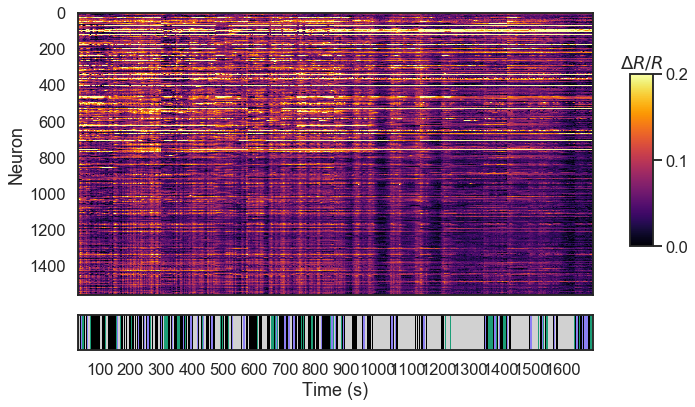

In [168]:
nf=1
reload(plotting)
fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
expt_id = summary_dict_tot[nf]['expt_id']
plotting.show_raster_with_behav(summary_dict_tot[nf]['data_dict'],color_range=(0,0.2),
                                split_behavior=summary_dict_tot[nf]['ro'].params['split_behav'],
                                title='',activity='nobase',sort=False,
                               include_beh_labels=True)
# plt.savefig(fig_dirs['fig_folder']+expt_id +'_residual_raster.pdf',transparent=False, bbox_inches='tight')
plt.show()

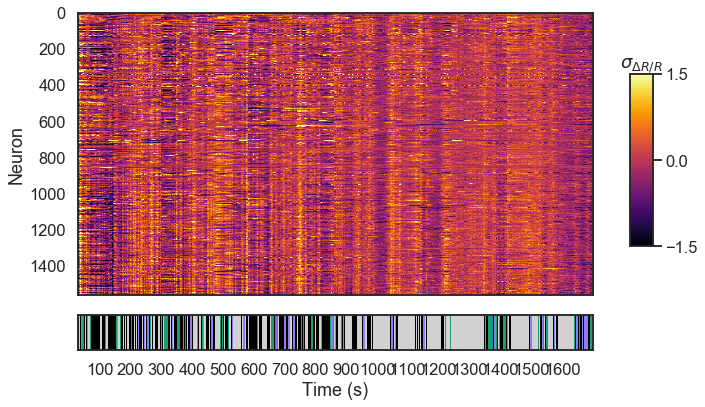

In [171]:
nf=1
reload(plotting)
fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
expt_id = summary_dict_tot[nf]['expt_id']
plotting.show_raster_with_behav(summary_dict_tot[nf]['data_dict'],color_range=(-1.5,1.5),
                                split_behavior=summary_dict_tot[nf]['ro'].params['split_behav'],
                                title='',activity='resid',sort=False,
                               include_beh_labels=True)
# plt.savefig(fig_dirs['fig_folder']+expt_id +'_residual_raster.pdf',transparent=False, bbox_inches='tight')
plt.show()

### update train/val samples for every dataset

In [191]:
# remake train/test sets (both to be able to repeat and to account for downsampling)
reload(reg_model)
seconds_per_trial = 10 #5 # size of chunks

for nf in range(np.shape(exp_list)[0]):
    expt_id = summary_dict_tot[nf]['expt_id']
    data_dict = summary_dict_tot[nf]['data_dict']
    fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
    print(expt_id)

    ror = reg_model.reg_obj(exp_id=expt_id, 
                   data_dict=data_dict,
                   fig_dirs=futils.get_fig_dirs(expt_id))
    ror.get_train_test_data(trial_len=int(seconds_per_trial*data_dict['scanRate']))
    data_dict['train_all'] = ror.data_dict['train_all'].copy()
    data_dict['val_all'] = ror.data_dict['val_all'].copy()
    ror.get_train_test_data(activity='dFF_resid_base', trial_len=int(seconds_per_trial*data_dict['scanRate']))
    data_dict['train_all_res'] = ror.data_dict['train_all'].copy()
    data_dict['val_all_res'] = ror.data_dict['val_all'].copy()
    

2019_07_01_fly2
2019_08_14_fly1
2019_08_14_fly3_2
2019_10_10_fly3
2019_10_21_fly1


### pca on null residual

In [192]:
# trial_len = 160  # length of pseudo-trialsl
# n_trials = np.floor(data_neural.shape[0] / trial_len)
# indxs = split_trials(
#     n_trials, trials_tr=10, trials_val=2, trials_test=0, trials_gap=0)

In [174]:
n_components = 100
ll_train = np.zeros( (len(exp_list),n_components) )
ll_val = np.zeros( (len(exp_list),n_components) )
var_exp = np.zeros( (len(exp_list),n_components) )

for nf in range(np.shape(exp_list)[0]):
    expt_id = summary_dict_tot[nf]['expt_id']
    data_dict = summary_dict_tot[nf]['data_dict']
    fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
    print(expt_id)
    for n in range(n_components):
        pca = PCA(n_components=n+1)
        pca.fit(data_dict['train_all'])
        ll_train[nf,n] = pca.score(data_dict['train_all'])
        ll_val[nf,n] = pca.score(data_dict['val_all'])
    var_exp[nf,:] = np.cumsum(pca.explained_variance_ratio_)

2019_07_01_fly2
2019_08_14_fly1
2019_08_14_fly3_2
2019_10_10_fly3
2019_10_21_fly1


In [175]:
ll_max = np.argmax(ll_val, axis=1)
ll_99 = np.zeros((2,len(ll_max)))
for i in range(len(ll_max)):
    ll_99[0,i] = ll_max[i]-np.argmin(abs(ll_val[i,:ll_max[i]] - .99*ll_val[i,ll_max[i]]))
    ll_99[1,i] = np.argmin(abs(ll_val[i,ll_max[i]:] - .99*ll_val[i,ll_max[i]]))

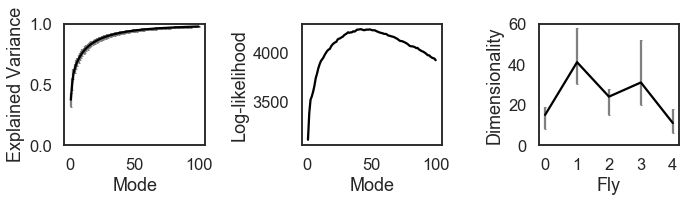

In [97]:
var_exp_m = var_exp.mean(axis=0)
var_exp_sem = np.std(var_exp, axis=0)/np.sqrt(var_exp.shape[0])

plt.figure(figsize=(10, 3))
ax1 = plt.subplot(131)
ax1.errorbar(np.arange(n_components)+1, var_exp_m, yerr=var_exp_sem, color='k',ecolor='gray',capsize=1)

plt.xlabel('Mode')
plt.ylabel('Explained Variance')
plt.ylim(0,1)
plt.xticks([0,50,100])

plt.subplot(132)
plt.plot(np.arange(n_components)+1, ll_val[1,:].T, 'k')
plt.xlabel('Mode')
plt.ylabel('Log-likelihood')
plt.xticks([0,50,100])

ax3 = plt.subplot(133)
ax3.errorbar([i for i in range(len(ll_max))], ll_max, yerr=ll_99, color='k',ecolor='gray',capsize=1)
plt.xlabel('Fly')
plt.ylabel('Dimensionality')
plt.ylim(0,60)
plt.xticks([i for i in range(len(ll_max))])

plt.tight_layout()
# plt.savefig(fig_folder + exp_date + '_' + fly_num +'_PC_loglikelihood.pdf',transparent=False, bbox_inches='tight')
plt.savefig(dirs['results'] + '_summary/PC_loglikelihood_nullResid.pdf',transparent=True, bbox_inches='tight')
plt.show()

### pca on FULL residual

In [658]:
n_components = 100
ll_train_res = np.zeros( (len(exp_list),n_components) )
ll_val_res = np.zeros( (len(exp_list),n_components) )
var_exp_res = np.zeros( (len(exp_list),n_components) )

for nf in range(np.shape(exp_list)[0]):
    expt_id = summary_dict_tot[nf]['expt_id']
    data_dict = summary_dict_tot[nf]['data_dict']
    fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
    print(expt_id)
    for n in range(n_components):
        pca = PCA(n_components=n+1)
        pca.fit(data_dict['train_all_res'])
        ll_train_res[nf,n] = pca.score(data_dict['train_all_res'])
        ll_val_res[nf,n] = pca.score(data_dict['val_all_res'])
    var_exp_res[nf,:] = np.cumsum(pca.explained_variance_ratio_)

2019_07_01_fly2
2019_08_14_fly1
2019_08_14_fly3_2
2019_10_10_fly3
2019_10_21_fly1


In [659]:
ll_max_res = np.argmax(ll_val_res, axis=1)
ll_99_res = np.zeros((2,len(ll_max_res)))
for i in range(len(ll_max)):
    ll_99_res[0,i] = ll_max_res[i]-np.argmin(abs(ll_val_res[i,:ll_max_res[i]] - .99*ll_val_res[i,ll_max_res[i]]))
    ll_99_res[1,i] = np.argmin(abs(ll_val_res[i,ll_max_res[i]:] - .99*ll_val_res[i,ll_max_res[i]]))

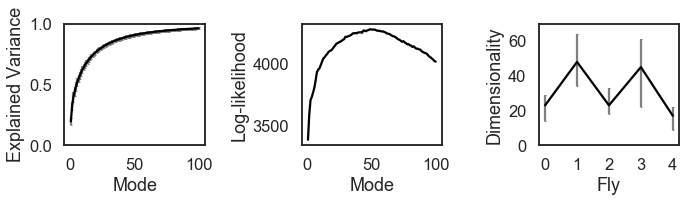

In [660]:
var_exp_m_res = var_exp_res.mean(axis=0)
var_exp_sem_res = np.std(var_exp_res, axis=0)/np.sqrt(var_exp_res.shape[0])

plt.figure(figsize=(10, 3))
ax1 = plt.subplot(131)
ax1.errorbar(np.arange(n_components)+1, var_exp_m_res, yerr=var_exp_sem_res, color='k',ecolor='gray',capsize=1)

plt.xlabel('Mode')
plt.ylabel('Explained Variance')
plt.ylim(0,1)
plt.xticks([0,50,100])

plt.subplot(132)
plt.plot(np.arange(n_components)+1, ll_val_res[1,:].T, 'k')
plt.xlabel('Mode')
plt.ylabel('Log-likelihood')
plt.xticks([0,50,100])

ax3 = plt.subplot(133)
ax3.errorbar([i for i in range(len(ll_max_res))], ll_max_res, yerr=ll_99_res, color='k',ecolor='gray',capsize=1)
plt.xlabel('Fly')
plt.ylabel('Dimensionality')
plt.yticks([0,20,40,60])
plt.ylim(0,70)
plt.xticks([i for i in range(len(ll_max_res))])

plt.tight_layout()
plt.savefig(dirs['results'] + '_summary/PC_loglikelihood_fullResid.pdf',transparent=True, bbox_inches='tight')
plt.show()

# show un-aligned residual maps

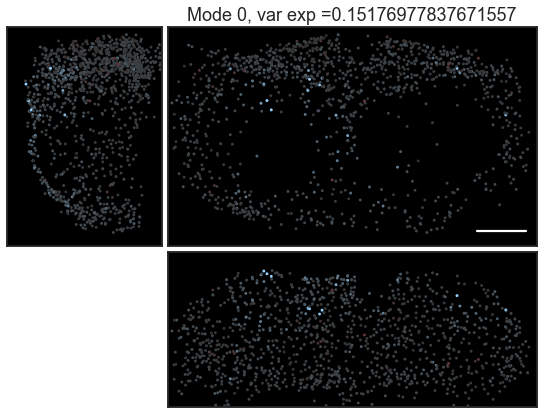

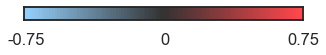

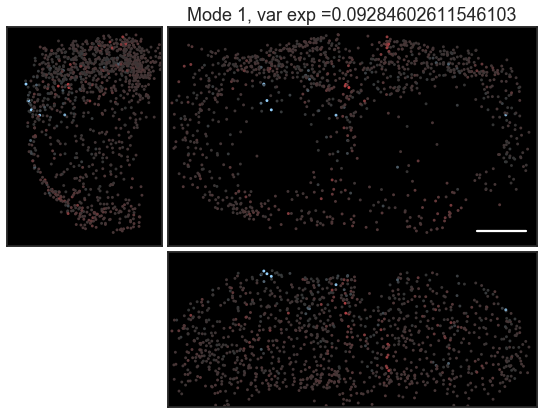

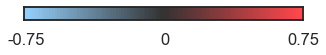

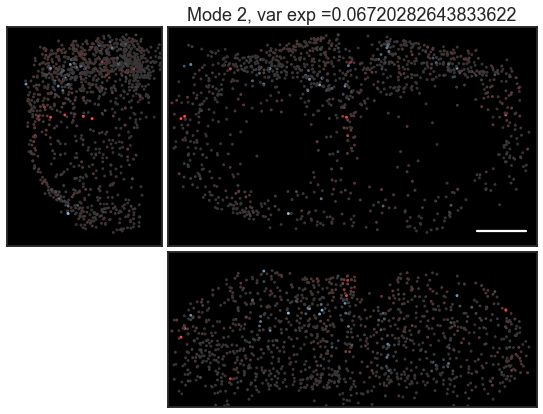

...

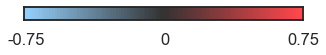

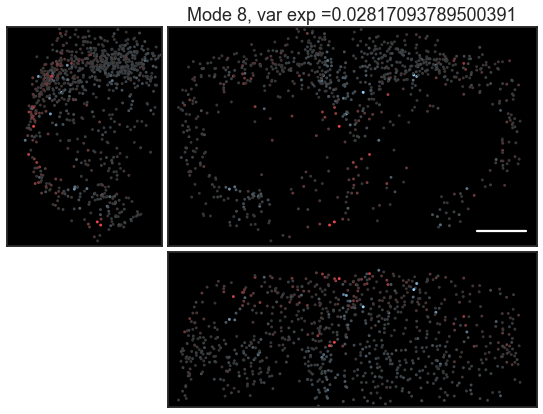

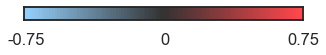

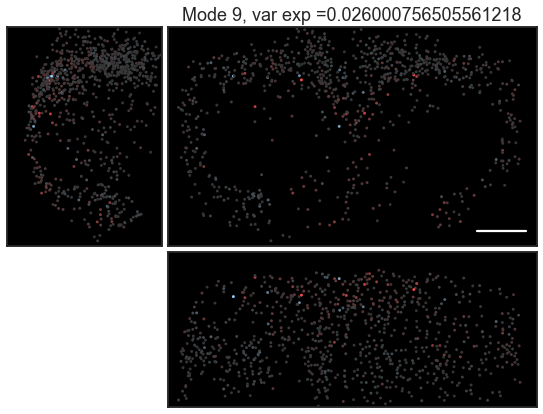

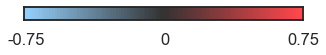

In [661]:
reload(plotting)
color_lims_scale=[-.75,.75]

for nf in range(np.shape(exp_list)[0]):
    expt_id = summary_dict_tot[nf]['expt_id']
    data_dict = summary_dict_tot[nf]['data_dict']
    fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
    pca = PCA(n_components=n_components)
    pca.fit(data_dict['train_all_res'])

    for nc in range(10):
        plot_param = pca.components_[nc,:]
        
        if nc==0:
            ve = var_exp_res[nf,nc]
        else:
            ve = var_exp_res[nf,nc]-var_exp_res[nf,nc-1]
        title = 'Mode '+str(nc)+', var exp ='+str(ve)
        _ = plotting.show_colorCoded_cellMap_points(data_dict, None, plot_param, cmap=plotting.cold_to_hot_cmap(), pval=0.01, color_lims_scale=color_lims_scale, title=title)
        plt.savefig(fig_dirs['pcfig_folder'] +expt_id+'_ResidMode_'+str(nc+1)+'_map.pdf',transparent=False, bbox_inches='tight')
        
        _ = plotting.cold_to_hot_cmap(show_map=True, tks=[0,50,100], tk_labels=[str(color_lims_scale[0]),'0',str(color_lims_scale[1])])
        plt.savefig(fig_dirs['pcfig_folder'] +expt_id+'_ResidMode_'+str(nc+1)+'_colormap.pdf',transparent=False, bbox_inches='tight')

        plt.show()


# Mode Sparseness (participation ratio)

In [199]:
n_components = 200
NP = n_components
participation = np.zeros((len(exp_list),NP))

for nf in range(len(exp_list)):
    expt_id = summary_dict_tot[nf]['expt_id']
    data_dict = summary_dict_tot[nf]['data_dict']
    fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
    pca = PCA(n_components=n_components)
    pca.fit(data_dict['train_all_res'])
    
    for nc in range(NP):
        v = pca.components_[nc,:]
        participation[nf, nc] = (  sum(v**2)**2/sum(v**4)  )/len(v)

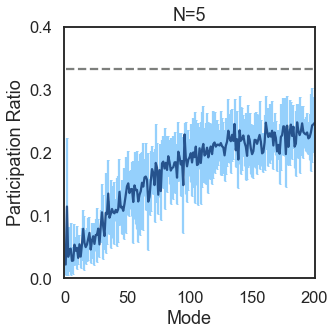

In [200]:
### plot participation ratio

# L = list(participation_tot.keys())
# A = np.zeros((len(L), len(participation_tot[L[0]])))
# for i in enumerate(L):
#     A[i[0],:] = participation_tot[i[1]]

m = participation.mean(axis=0)
s = participation.std(axis=0)
x = [i for i in range(1,NP+1)]

plt.figure(figsize=(5,5))
plt.plot([1,NP],[.333,.333],'--',color='#7d7f7c')
plt.errorbar(x, m, yerr=s,color='#26538d',ecolor='#95d0fc',capsize=1)
plt.ylabel('Participation Ratio')
plt.xlabel('Mode')
plt.ylim(0, 0.4)
plt.xlim(0,NP)
# plt.yscale('log',subsy=[.2,.3,.4,.5,.6],basey=10)
# plt.xticks([10,20,30,40])
# print(plt.yticks())
plt.yticks([0,0.1,0.2,0.3,0.4])
plt.title('N='+str(len(exp_list)))
plt.tight_layout()
plt.savefig(dirs['results'] + 'summary_mode_var_explained_fullres.pdf', bbox_inches='tight')
plt.show()

# residual from full regression model contains structure

In [207]:
## get total residual (just subtracting drift terms)
nf=1
expt_id = summary_dict_tot[nf]['expt_id']
data_dict = summary_dict_tot[nf]['data_dict']
fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])

# data_dict['dFF_resid']

### redo the residual plot sorted by similarity to previous row

In [208]:
plot_order = np.zeros(data_dict['dFF_resid'].shape[0])
accounted_for = np.zeros(data_dict['dFF_resid'].shape[0])
last_idx = 0
accounted_for[0] = 1
ctr = 0

while accounted_for.sum()<len(accounted_for):
    if not np.mod(accounted_for.sum(),50): print(int(accounted_for.sum()),end=' ')
    # find the next partner
    argmn = None
    mn = np.inf
    for i in range(len(plot_order)):
        if not accounted_for[i]:
            v = (data_dict['dFF_resid'][last_idx,:]-data_dict['dFF_resid'][i,:]).var()
            if v<mn:
                argmn=i
                mn=v
    
    accounted_for[argmn] = 1
    last_idx=argmn
    ctr += 1
    plot_order[ctr]=argmn
            

50 100 150 200 250 300 350 400 450 500 550 600 650 700 750 800 850 900 950 1000 1050 1100 1150 1200 1250 1300 1350 1400 1450 1500 1550 

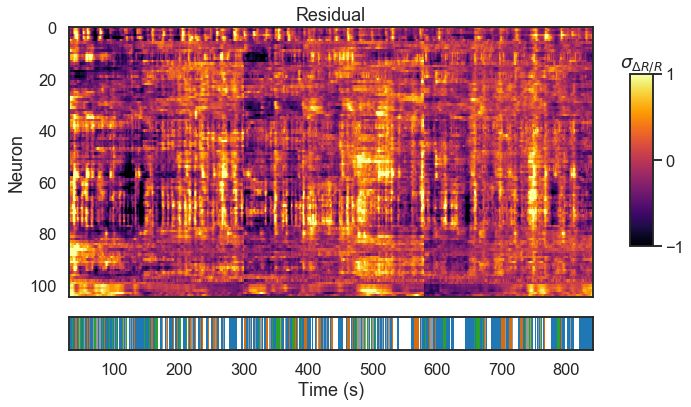

In [317]:
data_dict_res = copy.deepcopy(data_dict)
data_dict_res['dFF_resid'] = data_dict_res['dFF_resid'][plot_order.astype(int)[105:210],:]
ax = plotting.show_raster_with_behav(data_dict_res,color_range=(-1,1),
                                     activity='resid', time_lims=[0,4500], include_beh_labels=True)
ax[0].set_title('Residual')
plt.savefig(fig_dirs['pcfig_folder'] + expt_id +'_residual_examples.pdf', bbox_inches='tight')
# plt.show()

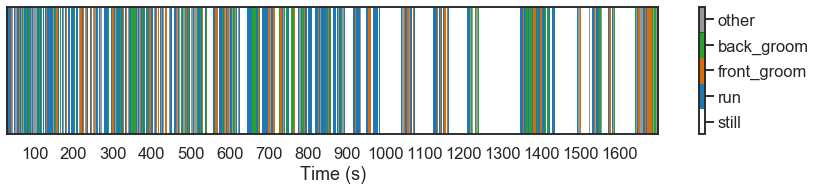

In [319]:
plotting.plot_states_simple(data_dict_res)
plt.savefig(fig_dirs['pcfig_folder'] + expt_id +'_residual_examples_cmap.pdf', bbox_inches='tight')

# Spatial downsampling for alignment

# Aligning dimensions - are there any common patterns?

plan:

- iterated procrustes
- After aligning B to A, for all B & all A, ask whether aligned PCs of B are predictive on held out data

# Dimensionality of running/quiescent subspaces

### prep by making train/test sets FOR EACH BEHAVIOR MOTIF


In [600]:
# summary_dict_tot_orig = copy.deepcopy(summary_dict_tot)

In [629]:
# summary_dict_tot[3]['data_dict'] = copy.deepcopy(summary_dict_tot_orig[3]['data_dict'])

In [630]:
# test 2019_10_10 trimmed on first 3 trials
# summary_dict_tot[3]['data_dict']['beh_labels'] = summary_dict_tot[3]['data_dict']['beh_labels'][:4720]
# summary_dict_tot[3]['data_dict']['dFF_resid_base'] = summary_dict_tot[3]['data_dict']['dFF_resid_base'][:,:4720]
summary_dict_tot[3]['data_dict']['beh_labels'] = summary_dict_tot[3]['data_dict']['beh_labels'][:6250]
summary_dict_tot[3]['data_dict']['dFF_resid_base'] = summary_dict_tot[3]['data_dict']['dFF_resid_base'][:,:6250]

In [674]:
# remake train/test sets FOR EACH BEHAVIOR MOTIF
reload(reg_model)
activity='dFF_resid_base' #'dFF' #
seconds_per_trial = 10 #5 # size of chunks

for nf in range(np.shape(exp_list)[0]):
    expt_id = summary_dict_tot[nf]['expt_id']
    data_dict = summary_dict_tot[nf]['data_dict']
    fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
    print(expt_id)

    tmp = {'train_all':None,'val_all':None}
    data_dict['dFF_parsed_by_beh_label'] = [tmp.copy() for i in range(4)]
    
    for i in range(4):
        try:
            behav_flag = np.squeeze(data_dict['beh_labels'])==i
            data_dict_tmp = copy.deepcopy(data_dict)
            data_dict_tmp[activity] = data_dict_tmp[activity][:,behav_flag]

            ror = reg_model.reg_obj(exp_id=expt_id, 
                       data_dict=data_dict_tmp,
                       fig_dirs=futils.get_fig_dirs(expt_id))
            ror.get_train_test_data(activity=activity, rng_seed=10000, 
                                    trial_len=int(seconds_per_trial*data_dict['scanRate']))
            data_dict['dFF_parsed_by_beh_label'][i]['train_all'] = ror.data_dict['train_all'].copy()
            data_dict['dFF_parsed_by_beh_label'][i]['val_all'] = ror.data_dict['val_all'].copy()
            data_dict['dFF_parsed_by_beh_label'][i]['all'] = data_dict_tmp[activity].T.copy()
        except:
            print('Not enough examples of label '+str(i))
    

2019_07_01_fly2
Not enough examples of label 2
Not enough examples of label 3
2019_08_14_fly1
2019_08_14_fly3_2
Not enough examples of label 1
Not enough examples of label 2
Not enough examples of label 3
2019_10_10_fly3
Not enough examples of label 1
Not enough examples of label 2
2019_10_21_fly1
Not enough examples of label 2


### PCA on each behavior subspace

In [675]:
def get_frac_var_exp(pca_obj, X):
    # manually compute explained variance for crossed terms
    # n=5
    # pca = PCA(n_components=n)
    # X = data_dict['dFF_parsed_by_beh_label'][l]['train_all'].copy() #np.random.rand(100,1000)
    # X -= X.mean(axis=0)
    # pca.fit(X)
    # print('variance explained: '+str(pca.explained_variance_ratio_.sum()))
    X_hat = pca_obj.inverse_transform(pca_obj.transform(X))
    v = X.var()
    vhat = (X_hat-X).var()
    frac_var_exp = (v-vhat)/v
    return frac_var_exp


In [677]:
# fix mean subtraction
for nf in range(np.shape(exp_list)[0]):
    expt_id = summary_dict_tot[nf]['expt_id']
    data_dict = summary_dict_tot[nf]['data_dict']
    fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
    print(expt_id)
    
    for l in range(4):
        if data_dict['dFF_parsed_by_beh_label'][l]['val_all'] is not None:
            data_dict['dFF_parsed_by_beh_label'][l]['val_all'] -= data_dict['dFF_parsed_by_beh_label'][l]['val_all'].mean(axis=0)
            data_dict['dFF_parsed_by_beh_label'][l]['train_all'] -= data_dict['dFF_parsed_by_beh_label'][l]['train_all'].mean(axis=0)
            data_dict['dFF_parsed_by_beh_label'][l]['all'] -= data_dict['dFF_parsed_by_beh_label'][l]['all'].mean(axis=0)

2019_07_01_fly2
2019_08_14_fly1
2019_08_14_fly3_2
2019_10_10_fly3
2019_10_21_fly1


In [678]:
n_components = 100

# like for like comparisons
ll_train_res = np.nan*np.zeros( (len(exp_list), 4, n_components) )
ll_val_res = np.nan*np.zeros( (len(exp_list), 4, n_components) )
var_exp_res = np.nan*np.zeros( (len(exp_list), 4, n_components) )

# mixed subspace comparisons
ll_val_res_mixed = np.nan*np.zeros( (len(exp_list), 4, n_components) )
var_exp_res_mixed = np.nan*np.zeros( (len(exp_list), 4, n_components) )

for nf in range(np.shape(exp_list)[0]):
    expt_id = summary_dict_tot[nf]['expt_id']
    data_dict = summary_dict_tot[nf]['data_dict']
    fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
    print(expt_id)
    
    for l in range(4):
        if data_dict['dFF_parsed_by_beh_label'][l]['val_all'] is not None:
            for n in range(n_components):
                pca = PCA(n_components=n+1)
                pca.fit(data_dict['dFF_parsed_by_beh_label'][l]['train_all'])
                ll_train_res[nf,l,n] = pca.score(data_dict['dFF_parsed_by_beh_label'][l]['train_all'])
                ll_val_res[nf,l,n] = pca.score(data_dict['dFF_parsed_by_beh_label'][l]['val_all'])
                
                # compare still to running.  Compare running, f.groom, b.groom to still.
                if l==0:
                    if data_dict['dFF_parsed_by_beh_label'][1]['val_all'] is not None:
                        ll_val_res_mixed[nf,l,n] = pca.score(data_dict['dFF_parsed_by_beh_label'][1]['all'])
                        var_exp_res_mixed[nf,l,n] = get_frac_var_exp(pca, data_dict['dFF_parsed_by_beh_label'][1]['all'])
                else:
                    ll_val_res_mixed[nf,l,n] = pca.score(data_dict['dFF_parsed_by_beh_label'][0]['all'])
                    var_exp_res_mixed[nf,l,n] = get_frac_var_exp(pca, data_dict['dFF_parsed_by_beh_label'][0]['all'])
            var_exp_res[nf,l,:] = np.cumsum(pca.explained_variance_ratio_)

2019_07_01_fly2
2019_08_14_fly1
2019_08_14_fly3_2
2019_10_10_fly3
2019_10_21_fly1


In [679]:
ll_max_check = ll_val_res.max(axis=2) #get max val to check for nan's
ll_max_res = np.argmax(ll_val_res, axis=2) # argmax is optimal dim, if max is not nan
ll_99_res = np.zeros((4,2,len(ll_max_res)))
for l in range(4):
    for i in range(np.shape(exp_list)[0]):
        if not np.isnan(ll_max_check[i,l]):
            ll_99_res[l,0,i] = ll_max_res[i,l]-np.argmin(abs(ll_val_res[i,l,:ll_max_res[i,l]] - .99*ll_val_res[i,l,ll_max_res[i,l]]))
            ll_99_res[l,1,i] = np.argmin(abs(ll_val_res[i,l,ll_max_res[i,l]:] - .99*ll_val_res[i,l,ll_max_res[i,l]]))

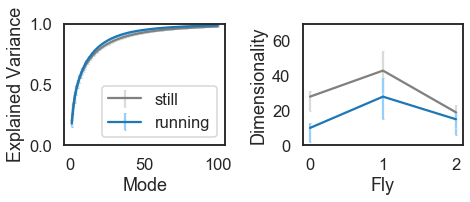

In [680]:
valid_fly = np.logical_not(np.isnan(ll_max_check[:,:2]).sum(axis=1)) # just running and still

var_exp_m_res = np.nanmean(var_exp_res, axis=0)
var_exp_sem_res = np.nanstd(var_exp_res, axis=0)/np.sqrt(var_exp_res.shape[0])

plt.figure(figsize=(7, 3))
ax1 = plt.subplot(121)
ax1.errorbar(np.arange(n_components)+1, var_exp_m_res[0,:], yerr=var_exp_sem_res[0,:].T, color='gray',ecolor='#d8dcd6',capsize=1,label='still')
ax1.errorbar(np.arange(n_components)+1, var_exp_m_res[1,:], yerr=var_exp_sem_res[1,:].T, color='tab:blue',ecolor='#95d0fc',capsize=1,label='running')
plt.xlabel('Mode')
plt.ylabel('Explained Variance')
plt.ylim(0,1)
plt.xticks([0,50,100])
plt.legend()


ax3 = plt.subplot(122)
ax3.errorbar([i for i in range(valid_fly.sum())], ll_max_res[valid_fly,0], yerr=np.squeeze(ll_99_res[0,:,valid_fly]).T, color='gray',ecolor='#d8dcd6',capsize=1)
ax3.errorbar([i for i in range(valid_fly.sum())], ll_max_res[valid_fly,1], yerr=np.squeeze(ll_99_res[0,:,valid_fly]).T, color='tab:blue',ecolor='#95d0fc',capsize=1)
plt.xlabel('Fly')
plt.ylabel('Dimensionality')
# plt.yticks([0,20,40,60])
plt.yticks([0,20,40,60])
plt.ylim(0,70)
plt.xticks([i for i in range(valid_fly.sum())])

plt.tight_layout()
plt.savefig(dirs['results'] + '_summary/PC_loglikelihood_behavParsed_'+activity+'.pdf',transparent=True, bbox_inches='tight')
plt.show()

### crossvalidate across subspaces to see how similar they are

In [681]:
ll_max_check = ll_val_res_mixed.max(axis=2) #get max val to check for nan's
ll_max_res = np.argmax(ll_val_res_mixed, axis=2) # argmax is optimal dim, if max is not nan
ll_99_res = np.zeros((4,2,len(ll_max_res)))
for l in range(4):
    for i in range(np.shape(exp_list)[0]):
        if not np.isnan(ll_max_check[i,l]):
            ll_99_res[l,0,i] = ll_max_res[i,l]-np.argmin(abs(ll_val_res[i,l,:ll_max_res[i,l]] - .99*ll_val_res[i,l,ll_max_res[i,l]]))
            ll_99_res[l,1,i] = np.argmin(abs(ll_val_res[i,l,ll_max_res[i,l]:] - .99*ll_val_res[i,l,ll_max_res[i,l]]))

In [682]:
# normalize variance explained in mixed case by same quantity in like for like case
var_exp_res_mixed_ratio = var_exp_res_mixed/var_exp_res

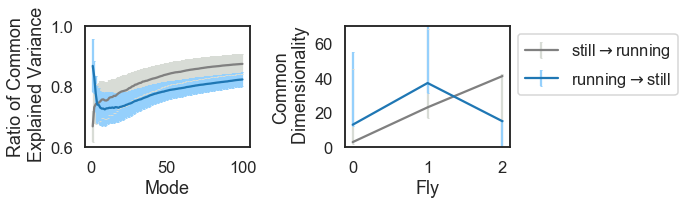

In [683]:
valid_fly = np.logical_not(np.isnan(ll_max_check[:,:2]).sum(axis=1)) # just running and still

var_exp_m_res = np.nanmean(var_exp_res_mixed_ratio, axis=0)
var_exp_sem_res = np.nanstd(var_exp_res_mixed_ratio, axis=0)/np.sqrt(var_exp_res_mixed_ratio.shape[0])

plt.figure(figsize=(9.85, 3))
ax1 = plt.subplot(121)
ax1.errorbar(np.arange(n_components)+1, var_exp_m_res[0,:], yerr=var_exp_sem_res[0,:].T, color='gray',ecolor='#d8dcd6',capsize=1,label=r'still$\rightarrow$running')
ax1.errorbar(np.arange(n_components)+1, var_exp_m_res[1,:], yerr=var_exp_sem_res[1,:].T, color='tab:blue',ecolor='#95d0fc',capsize=1,label=r'running$\rightarrow$still')
plt.xlabel('Mode')
plt.ylabel('Ratio of Common\n Explained Variance')
plt.ylim(0.6,1)
plt.xticks([0,50,100])
# plt.legend(bbox_to_anchor=(1, 0), loc='lower right', ncol=1)

ax3 = plt.subplot(122)
ax3.errorbar([i for i in range(valid_fly.sum())], ll_max_res[valid_fly,0], yerr=np.squeeze(ll_99_res[0,:,valid_fly]).T, color='gray',ecolor='#d8dcd6',capsize=1,label=r'still$\rightarrow$running')
ax3.errorbar([i for i in range(valid_fly.sum())], ll_max_res[valid_fly,1], yerr=np.squeeze(ll_99_res[0,:,valid_fly]).T, color='tab:blue',ecolor='#95d0fc',capsize=1,label=r'running$\rightarrow$still')
plt.xlabel('Fly')
plt.ylabel('Common\n Dimensionality')
# plt.yticks([0,20,40,60])
plt.yticks([0,20,40,60])
plt.ylim(0,70)
plt.xticks([i for i in range(valid_fly.sum())])
plt.legend(bbox_to_anchor=(1, 1), loc='upper left', ncol=1)

plt.tight_layout()
plt.savefig(dirs['results'] + '_summary/PC_loglikelihood_behavMixed_'+activity+'.pdf',transparent=True, bbox_inches='tight')
plt.show()

### visualize largest subspace modes

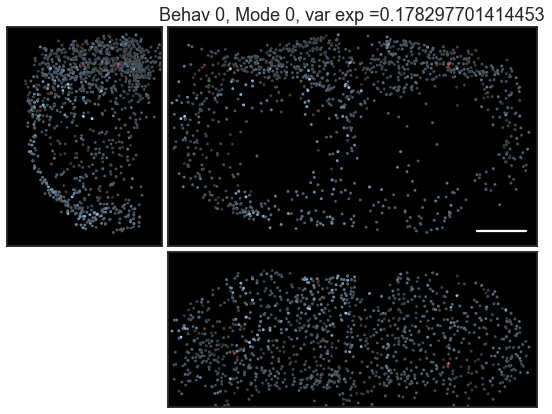

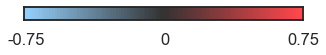

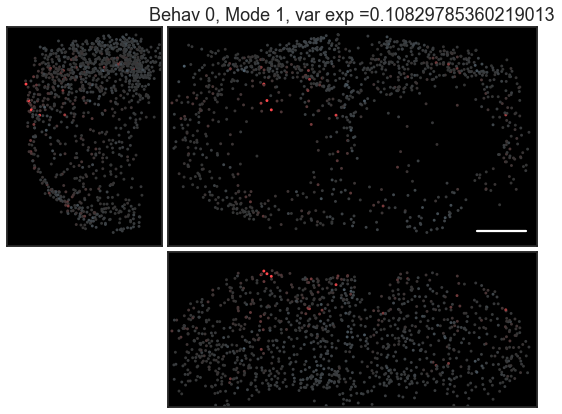

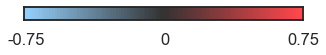

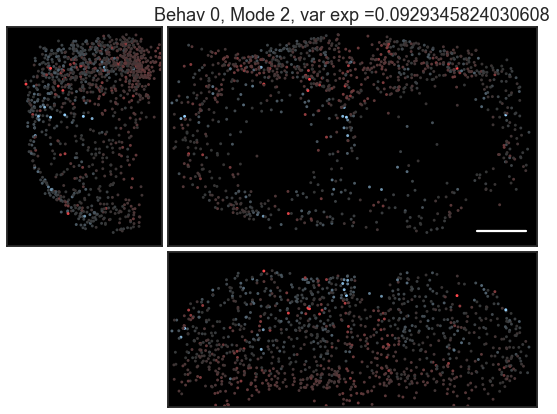

...

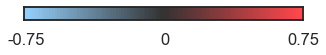

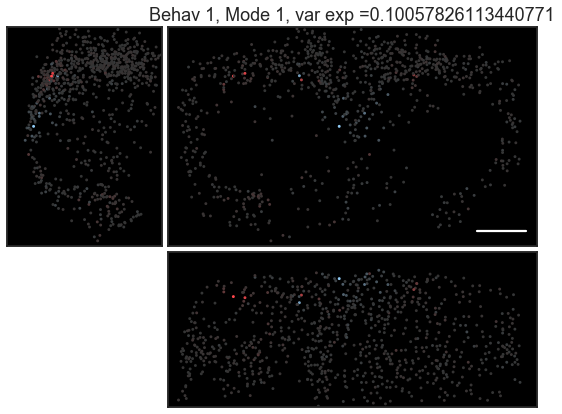

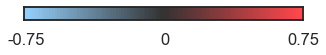

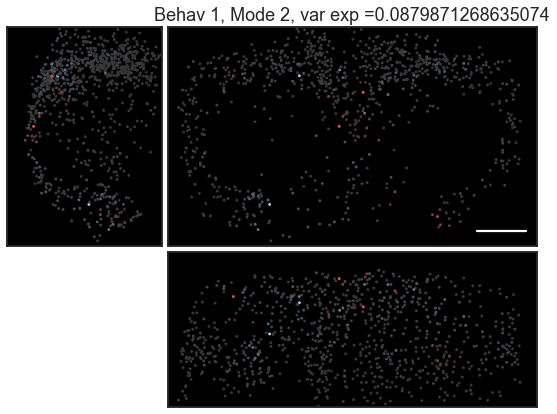

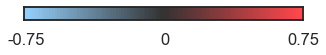

In [657]:
reload(plotting)
color_lims_scale=[-.75,.75]

for nf in range(np.shape(exp_list)[0]):
    expt_id = summary_dict_tot[nf]['expt_id']
    data_dict = summary_dict_tot[nf]['data_dict']
    fig_dirs = futils.get_fig_dirs(summary_dict_tot[nf]['expt_id'])
    
    for l in range(2):
        if data_dict['dFF_parsed_by_beh_label'][l]['train_all'] is not None:
            pca = PCA(n_components=n_components)
            pca.fit(data_dict['dFF_parsed_by_beh_label'][l]['train_all'])

            for nc in range(3):
                plot_param = pca.components_[nc,:]

                if nc==0:
                    ve = var_exp_res[nf,l,nc]
                else:
                    ve = var_exp_res[nf,l,nc]-var_exp_res[nf,l,nc-1]
                title = 'Behav '+str(l)+', Mode '+str(nc)+', var exp ='+str(ve)
                _ = plotting.show_colorCoded_cellMap_points(data_dict, None, plot_param, cmap=plotting.cold_to_hot_cmap(), pval=0.01, color_lims_scale=color_lims_scale, title=title)
                plt.savefig(fig_dirs['pcfig_folder'] +expt_id+'_Behav_'+str(l)+'_Mode_'+str(nc+1)+'_map.pdf',transparent=False, bbox_inches='tight')

                _ = plotting.cold_to_hot_cmap(show_map=True, tks=[0,50,100], tk_labels=[str(color_lims_scale[0]),'0',str(color_lims_scale[1])])
                plt.savefig(fig_dirs['pcfig_folder'] +expt_id+'_Behav_'+str(l)+'_Mode_'+str(nc+1)+'_colormap.pdf',transparent=False, bbox_inches='tight')

                plt.show()


# Distribution of correlations in behavioral subspaces